<a href="https://colab.research.google.com/github/tayanarapaiva/PIM/blob/main/IM_ATV_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [125]:
#BIBLIOTECAS

import cv2 #Biblioteca OpenCV
import numpy as np
import matplotlib.pyplot as plt

import copy as cp
from PIL import Image

from google.colab import drive
from google.colab.patches import cv2_imshow

from scipy.stats import mode #para moda da imagem
from skimage.metrics import structural_similarity as ssim
from sklearn.cluster import KMeans
from skimage import filters #para a técnica de Frangi
!pip install scikit-image
from skimage.filters import frangi

from sklearn.cluster import KMeans #  k-mens


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [24]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# ATIVIDADE 05

1. Identificar as bordas usando os métodos de Sobel, Roberts, Prewit, laplaciano e canny (apresentar também a identificação das linhas verticais e horizontais), usando filtro da média e sem o filtro da média
2. Procurar uma outra técnica para identificação de bordas, usando filtro da média e sem o filtro da média
3. Usar K-Mens para identificar os objetos das imagens, dependendo use técnicas já apresentadas
4. Identificar pontos na imagem, dependendo use técnicas já apresentadas

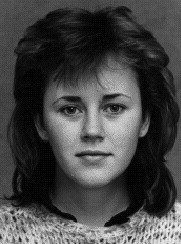

Original - altura, largura, canais: (244, 181, 3)


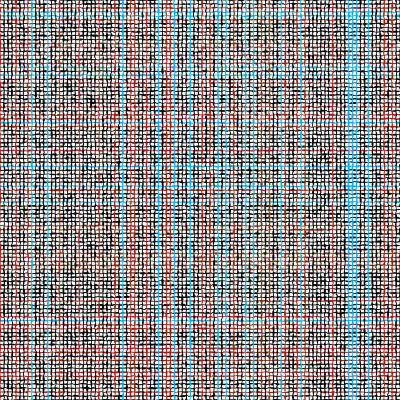

Redimensionada - altura, largura, canais: (400, 400, 3)


In [114]:
# ler e mostrar imagem:



img = cv2.imread('/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg')
img_2 = cv2.imread('/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/linhas.jpg')

cv2_imshow(img)
print('Original - altura, largura, canais:', img.shape)

# Redimensionar a imagem img_2 para metade do tamanho original
resized_img_2 = cv2.resize(img_2, None, fx=0.5, fy=0.5)
cv2_imshow(resized_img_2)
print('Redimensionada - altura, largura, canais:', resized_img_2.shape)


#1- IDENTIFICAR BORDAS

SOBEL SEM FILTRO DE MÉDIA

Exemplo 01:

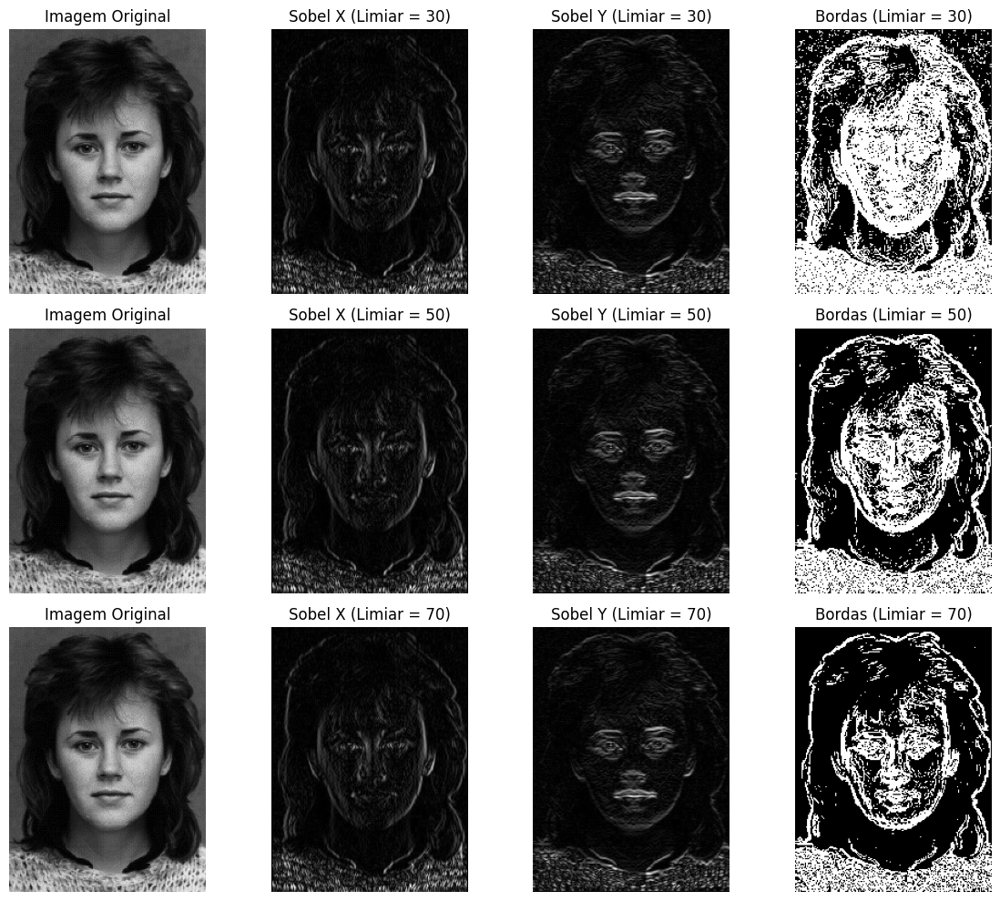

In [32]:

def detect_edges_sobel(image, threshold):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Aplicando o operador Sobel
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    
    # Calculando a magnitude das derivadas
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    magnitude = np.uint8(magnitude)
    
    # Limiarizando a magnitude para obter as bordas
    edges = cv2.threshold(magnitude, threshold, 255, cv2.THRESH_BINARY)[1]
    
    return sobelx, sobely, edges

# Carregando a imagem
image = cv2.imread('/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg')

# Definindo os valores de limiarização
thresholds = [30, 50, 70]

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(len(thresholds), 4, figsize=(12, 10))

# Iterando sobre os diferentes valores de limiarização
for i, threshold in enumerate(thresholds):
    # Exibindo a imagem original
    axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Imagem Original')
    axes[i, 0].axis('off')

    # Detectando as bordas usando o método de Sobel
    sobelx, sobely, edges = detect_edges_sobel(image, threshold)
    
    # Exibindo as derivadas Sobel em X e Y
    axes[i, 1].imshow(np.abs(sobelx), cmap='gray')
    axes[i, 1].set_title(f'Sobel X (Limiar = {threshold})')
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(np.abs(sobely), cmap='gray')
    axes[i, 2].set_title(f'Sobel Y (Limiar = {threshold})')
    axes[i, 2].axis('off')

    # Exibindo as bordas detectadas
    axes[i, 3].imshow(edges, cmap='gray')
    axes[i, 3].set_title(f'Bordas (Limiar = {threshold})')
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()


SOBEL SEM FILTRO DE MÉDIA

Exemplo 02:

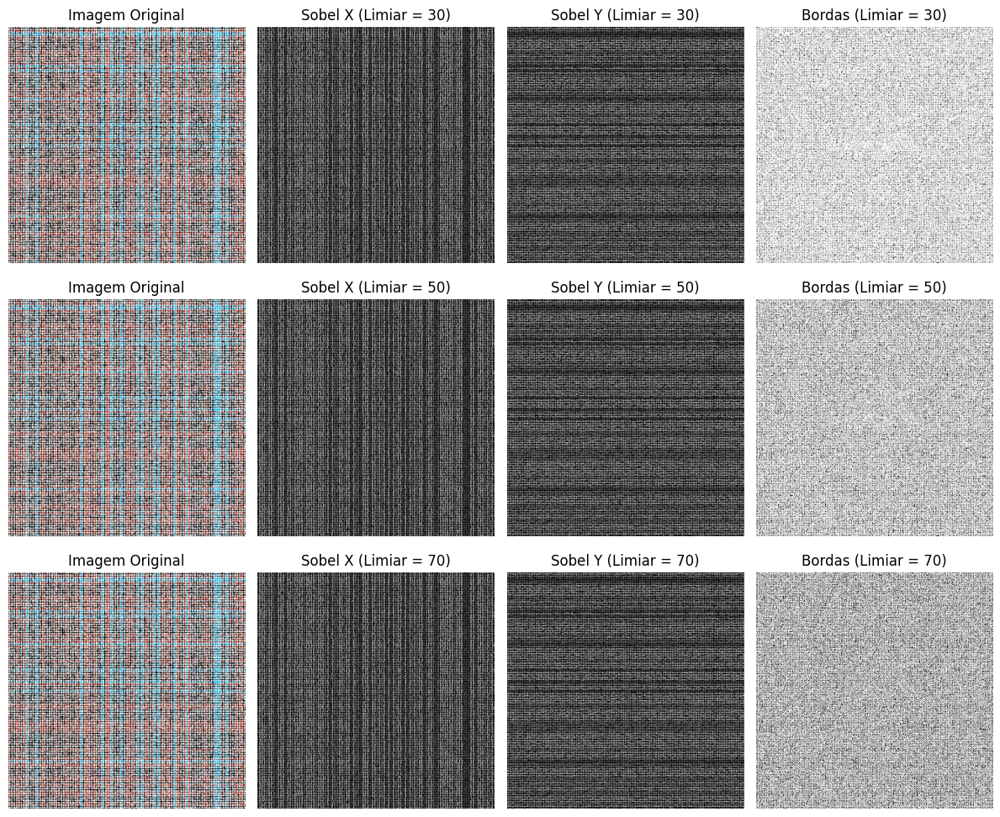

In [33]:
# SOBEL 


def detect_edges_sobel(image, threshold):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Aplicando o operador Sobel
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    
    # Calculando a magnitude das derivadas
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    magnitude = np.uint8(magnitude)
    
    # Limiarizando a magnitude para obter as bordas
    edges = cv2.threshold(magnitude, threshold, 255, cv2.THRESH_BINARY)[1]
    
    return sobelx, sobely, edges

# Carregando a imagem
image = cv2.imread('/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/linhas.jpg')

# Definindo os valores de limiarização
thresholds = [30, 50, 70]

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(len(thresholds), 4, figsize=(12, 10))

# Iterando sobre os diferentes valores de limiarização
for i, threshold in enumerate(thresholds):
    # Exibindo a imagem original
    axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Imagem Original')
    axes[i, 0].axis('off')

    # Detectando as bordas usando o método de Sobel
    sobelx, sobely, edges = detect_edges_sobel(image, threshold)
    
    # Exibindo as derivadas Sobel em X e Y
    axes[i, 1].imshow(np.abs(sobelx), cmap='gray')
    axes[i, 1].set_title(f'Sobel X (Limiar = {threshold})')
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(np.abs(sobely), cmap='gray')
    axes[i, 2].set_title(f'Sobel Y (Limiar = {threshold})')
    axes[i, 2].axis('off')

    # Exibindo as bordas detectadas
    axes[i, 3].imshow(edges, cmap='gray')
    axes[i, 3].set_title(f'Bordas (Limiar = {threshold})')
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()


SOBEL COM FILTRO DE MÉDIA:

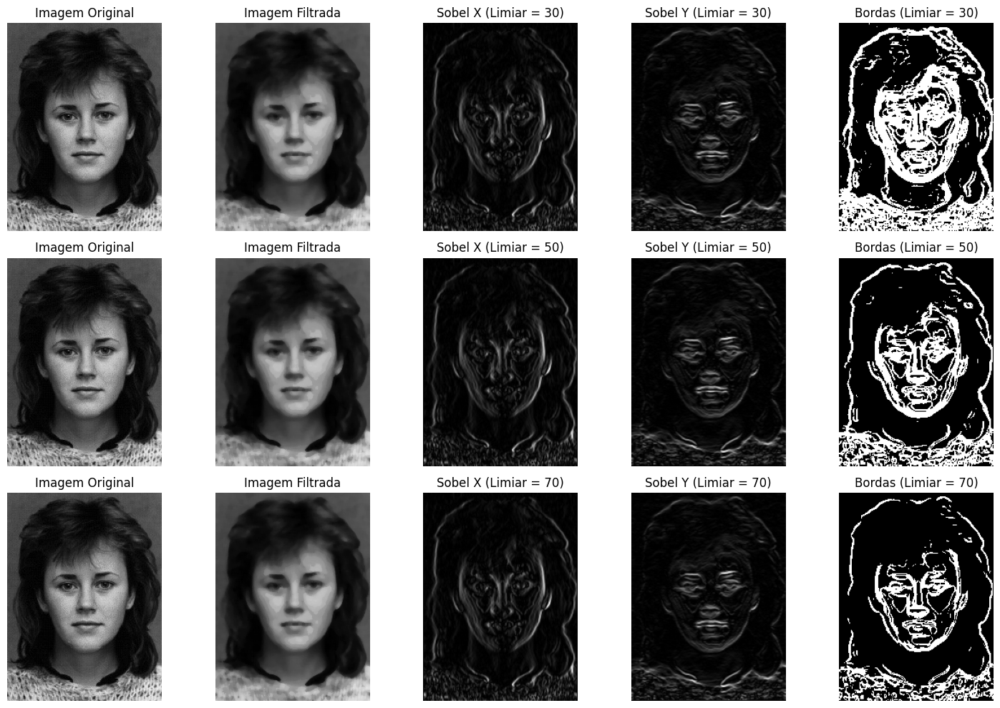

In [92]:
def detect_edges_sobel(image, threshold):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Aplicando o filtro de média na imagem original
    filtered_image = cv2.medianBlur(gray, 5)
    
    # Aplicando o operador Sobel
    sobelx = cv2.Sobel(filtered_image, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(filtered_image, cv2.CV_64F, 0, 1, ksize=3)
    
    # Calculando a magnitude das derivadas
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    magnitude = np.uint8(magnitude)
    
    # Limiarizando a magnitude para obter as bordas
    edges = cv2.threshold(magnitude, threshold, 255, cv2.THRESH_BINARY)[1]
    
    return sobelx, sobely, edges, filtered_image

# Carregando a imagem
image = cv2.imread('/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg')

# Definindo os valores de limiarização
thresholds = [30, 50, 70]

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(len(thresholds), 5, figsize=(15, 10))

# Iterando sobre os diferentes valores de limiarização
for i, threshold in enumerate(thresholds):
    # Exibindo a imagem original
    axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Imagem Original')
    axes[i, 0].axis('off')
    
    # Aplicando o filtro de média na imagem original
    filtered_image = cv2.medianBlur(image, 5)
    
    # Exibindo a imagem filtrada
    axes[i, 1].imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title('Imagem Filtrada')
    axes[i, 1].axis('off')

    # Detectando as bordas usando o método de Sobel com filtro de média
    sobelx, sobely, edges, _ = detect_edges_sobel(image, threshold)
    
    # Exibindo as derivadas Sobel em X e Y
    axes[i, 2].imshow(np.abs(sobelx), cmap='gray')
    axes[i, 2].set_title(f'Sobel X (Limiar = {threshold})')
    axes[i, 2].axis('off')
    
    axes[i, 3].imshow(np.abs(sobely), cmap='gray')
    axes[i, 3].set_title(f'Sobel Y (Limiar = {threshold})')
    axes[i, 3].axis('off')

    # Exibindo as bordas detectadas
    axes[i, 4].imshow(edges, cmap='gray')
    axes[i, 4].set_title(f'Bordas (Limiar = {threshold})')
    axes[i, 4].axis('off')

plt.tight_layout()
plt.show()


ROBERTS SEM FILTRO:

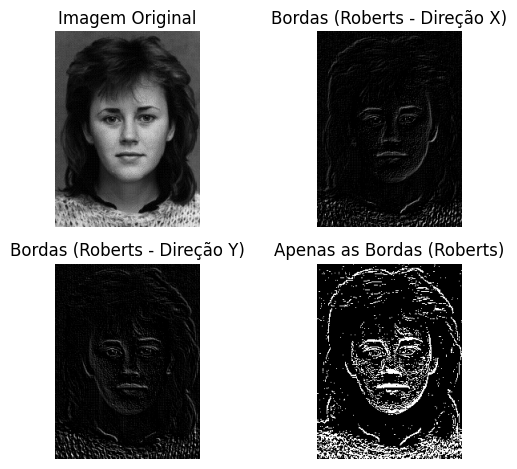

In [94]:
def detect_edges_roberts(image, threshold):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Criando os kernels para Roberts
    kernel_x = np.array([[1, 0], [0, -1]], dtype=np.float32)
    kernel_y = np.array([[0, 1], [-1, 0]], dtype=np.float32)

    # Aplicando a convolução para obter as derivadas em X e Y
    roberts_x = cv2.filter2D(gray, -1, kernel_x)
    roberts_y = cv2.filter2D(gray, -1, kernel_y)

    # Calculando a magnitude das derivadas
    roberts = np.abs(roberts_x) + np.abs(roberts_y)

    # Limiarizando a imagem para obter as bordas
    edges = np.zeros_like(roberts)
    edges[roberts > threshold] = 255

    return edges, roberts_x, roberts_y

# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path)

# Definindo o valor de limiarização
threshold = 20

# Detectando as bordas usando o método de Roberts
edges, roberts_x, roberts_y = detect_edges_roberts(image, threshold)

# Exibindo a imagem original
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Imagem Original')
plt.axis('off')

# Exibindo as bordas detectadas usando o método de Roberts (direção X)
plt.subplot(2, 2, 2)
plt.imshow(np.abs(roberts_x), cmap='gray')
plt.title('Bordas (Roberts - Direção X)')
plt.axis('off')

# Exibindo as bordas detectadas usando o método de Roberts (direção Y)
plt.subplot(2, 2, 3)
plt.imshow(np.abs(roberts_y), cmap='gray')
plt.title('Bordas (Roberts - Direção Y)')
plt.axis('off')

# Exibindo apenas as bordas na última imagem
plt.subplot(2, 2, 4)
plt.imshow(edges, cmap='gray')
plt.title('Apenas as Bordas (Roberts)')
plt.axis('off')

plt.tight_layout()
plt.show()


ROBERTS COM FILTRO:

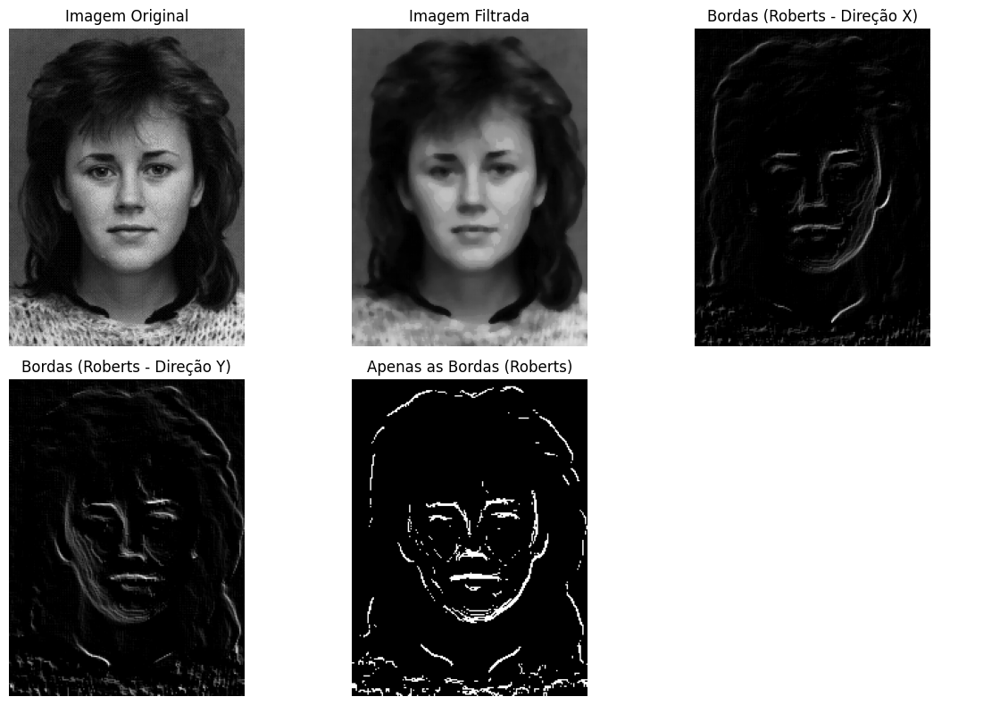

In [97]:
def detect_edges_roberts(image, threshold):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Criando os kernels para Roberts
    kernel_x = np.array([[1, 0], [0, -1]], dtype=np.float32)
    kernel_y = np.array([[0, 1], [-1, 0]], dtype=np.float32)

    # Aplicando a convolução para obter as derivadas em X e Y
    roberts_x = cv2.filter2D(gray, -1, kernel_x)
    roberts_y = cv2.filter2D(gray, -1, kernel_y)

    # Calculando a magnitude das derivadas
    roberts = np.abs(roberts_x) + np.abs(roberts_y)

    # Limiarizando a imagem para obter as bordas
    edges = np.zeros_like(roberts)
    edges[roberts > threshold] = 255

    return edges, roberts_x, roberts_y

# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path)

# Aplicando o filtro de média na imagem original
filtered_image = cv2.medianBlur(image, 5)

# Definindo o valor de limiarização
threshold = 20

# Detectando as bordas usando o método de Roberts na imagem filtrada
edges, roberts_x, roberts_y = detect_edges_roberts(filtered_image, threshold)

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

# Exibindo a imagem original
axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Imagem Original')
axes[0, 0].axis('off')

# Exibindo a imagem filtrada
axes[0, 1].imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Imagem Filtrada')
axes[0, 1].axis('off')

# Exibindo as bordas detectadas usando o método de Roberts (direção X)
axes[0, 2].imshow(np.abs(roberts_x), cmap='gray')
axes[0, 2].set_title('Bordas (Roberts - Direção X)')
axes[0, 2].axis('off')

# Exibindo as bordas detectadas usando o método de Roberts (direção Y)
axes[1, 0].imshow(np.abs(roberts_y), cmap='gray')
axes[1, 0].set_title('Bordas (Roberts - Direção Y)')
axes[1, 0].axis('off')

# Exibindo apenas as bordas na última imagem
axes[1, 1].imshow(edges, cmap='gray')
axes[1, 1].set_title('Apenas as Bordas (Roberts)')
axes[1, 1].axis('off')

# Removendo eixos extras da última célula
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


PREWIT SEM FILTRO:

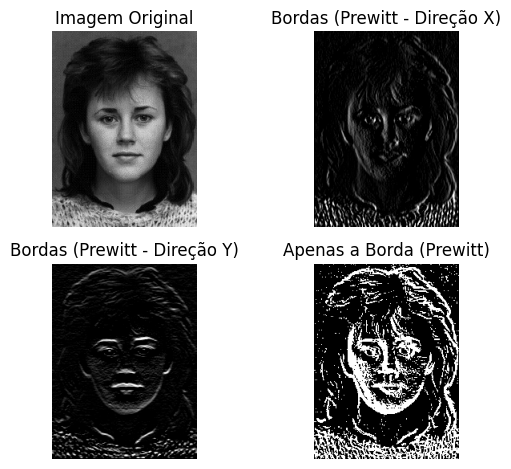

In [81]:


def detect_edges_prewitt(image, threshold):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Criando os kernels para Prewitt
    kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32)
    kernel_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]], dtype=np.float32)

    # Aplicando a convolução para obter as derivadas em X e Y
    prewitt_x = cv2.filter2D(gray, -1, kernel_x)
    prewitt_y = cv2.filter2D(gray, -1, kernel_y)

    # Calculando a magnitude das derivadas
    prewitt = np.abs(prewitt_x) + np.abs(prewitt_y)

    # Limiarizando a imagem para obter as bordas
    edges = np.zeros_like(prewitt)
    edges[prewitt > threshold] = 255

    return edges, prewitt_x, prewitt_y


# Carregando a imagem
image_path2 = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path2)

# Definindo o valor de limiarização
threshold = 30

# Detectando as bordas usando o operador Prewitt
edges, prewitt_x, prewitt_y = detect_edges_prewitt(image, threshold)

# Exibindo a imagem original
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Imagem Original')
plt.axis('off')

# Exibindo as bordas detectadas usando o operador Prewitt (direção X)
plt.subplot(2, 2, 2)
plt.imshow(np.abs(prewitt_x), cmap='gray')
plt.title('Bordas (Prewitt - Direção X)')
plt.axis('off')

# Exibindo as bordas detectadas usando o operador Prewitt (direção Y)
plt.subplot(2, 2, 3)
plt.imshow(np.abs(prewitt_y), cmap='gray')
plt.title('Bordas (Prewitt - Direção Y)')
plt.axis('off')

# Exibindo apenas a borda na última imagem
plt.subplot(2, 2, 4)
plt.imshow(edges, cmap='gray')
plt.title('Apenas a Borda (Prewitt)')
plt.axis('off')

plt.tight_layout()
plt.show()


PREWIT COM FILTRO:

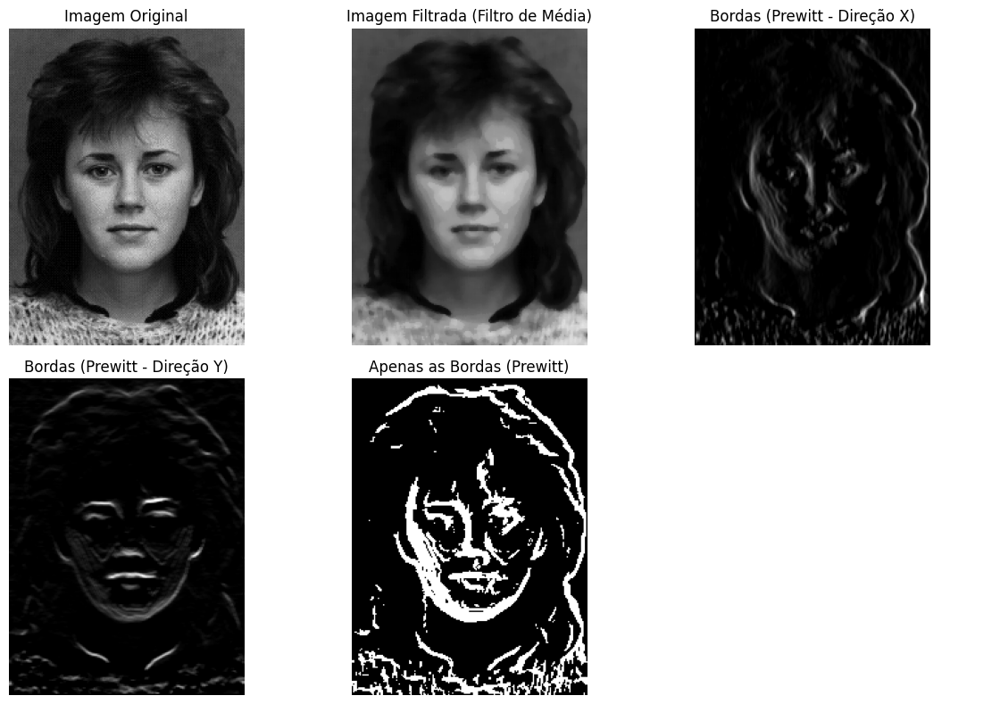

In [99]:
def detect_edges_prewitt(image, threshold):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Criando os kernels para Prewitt
    kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32)
    kernel_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]], dtype=np.float32)

    # Aplicando a convolução para obter as derivadas em X e Y
    prewitt_x = cv2.filter2D(gray, -1, kernel_x)
    prewitt_y = cv2.filter2D(gray, -1, kernel_y)

    # Calculando a magnitude das derivadas
    prewitt = np.abs(prewitt_x) + np.abs(prewitt_y)

    # Limiarizando a imagem para obter as bordas
    edges = np.zeros_like(prewitt)
    edges[prewitt > threshold] = 255

    return edges, prewitt_x, prewitt_y


# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path)

# Definindo o valor de limiarização
threshold = 30

# Aplicando o filtro de média na imagem original
filtered_image = cv2.medianBlur(image, 5)

# Detectando as bordas usando o operador Prewitt na imagem filtrada
edges, prewitt_x, prewitt_y = detect_edges_prewitt(filtered_image, threshold)

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

# Exibindo a imagem original
axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Imagem Original')
axes[0, 0].axis('off')

# Exibindo a imagem filtrada
axes[0, 1].imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Imagem Filtrada (Filtro de Média)')
axes[0, 1].axis('off')

# Exibindo as bordas detectadas usando o operador Prewitt (direção X)
axes[0, 2].imshow(np.abs(prewitt_x), cmap='gray')
axes[0, 2].set_title('Bordas (Prewitt - Direção X)')
axes[0, 2].axis('off')

# Exibindo as bordas detectadas usando o operador Prewitt (direção Y)
axes[1, 0].imshow(np.abs(prewitt_y), cmap='gray')
axes[1, 0].set_title('Bordas (Prewitt - Direção Y)')
axes[1, 0].axis('off')

# Exibindo apenas as bordas na última imagem
axes[1, 1].imshow(edges, cmap='gray')
axes[1, 1].set_title('Apenas as Bordas (Prewitt)')
axes[1, 1].axis('off')

# Removendo eixos extras da última célula
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()



LAPLACIANO SEM FILTRO

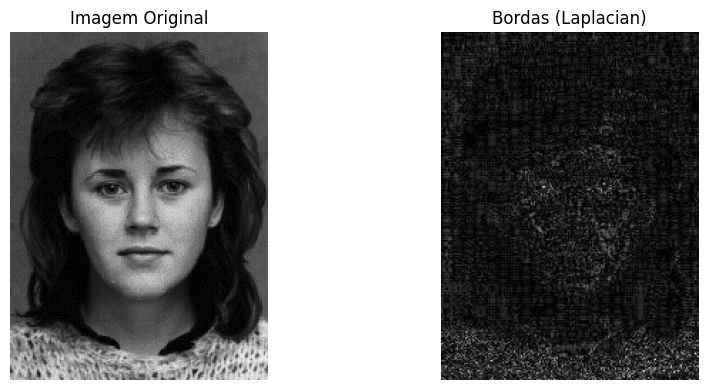

In [107]:
# Laplacian Edge Detection
def detect_edges_laplacian(image, threshold):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Aplicando o operador Laplaciano
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)

    # Limiarizando a imagem para obter as bordas
    edges = np.zeros_like(laplacian)
    edges[laplacian > threshold] = 255

    return edges, laplacian


# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path)

# Definindo o valor de limiarização
threshold = 30

# Detectando as bordas usando o operador Laplacian
edges, laplacian = detect_edges_laplacian(image, threshold)

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Exibindo a imagem original
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Imagem Original')
axes[0].axis('off')

# Exibindo as bordas detectadas usando o operador Laplacian
axes[1].imshow(np.abs(laplacian), cmap='gray')
axes[1].set_title('Bordas (Laplacian)')
axes[1].axis('off')

plt.tight_layout()
plt.show()


LAPLACIANO COM FILTRO

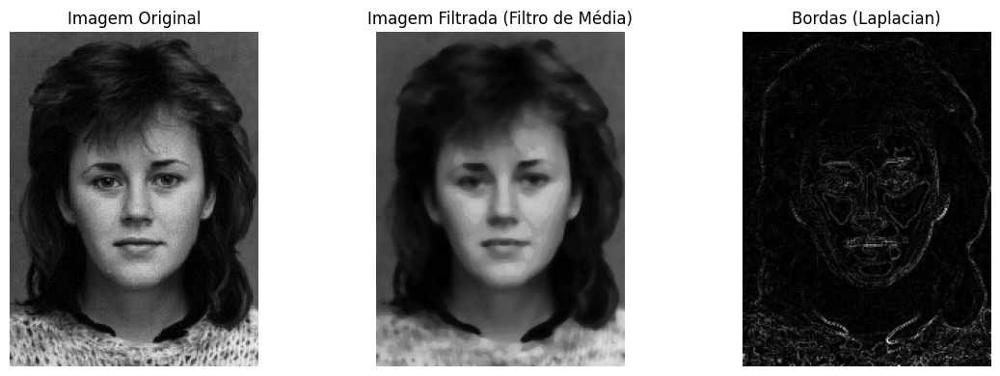

In [105]:
# Laplacian Edge Detection
def detect_edges_laplacian(image, threshold):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Aplicando o operador Laplaciano
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)

    # Limiarizando a imagem para obter as bordas
    edges = np.zeros_like(laplacian)
    edges[laplacian > threshold] = 255

    return edges, laplacian


# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path)

# Definindo o valor de limiarização
threshold = 10

# Aplicando o filtro de média na imagem original
filtered_image = cv2.medianBlur(image, 5)

# Detectando as bordas usando o operador Laplacian na imagem filtrada
edges, laplacian = detect_edges_laplacian(filtered_image, threshold)

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Exibindo a imagem original
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Imagem Original')
axes[0].axis('off')

# Exibindo a imagem filtrada
axes[1].imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
axes[1].set_title('Imagem Filtrada (Filtro de Média)')
axes[1].axis('off')

# Exibindo as bordas detectadas usando o operador Laplacian
axes[2].imshow(np.abs(laplacian), cmap='gray')
axes[2].set_title('Bordas (Laplacian)')
axes[2].axis('off')

plt.tight_layout()
plt.show()


CANNY SEM FILTRO

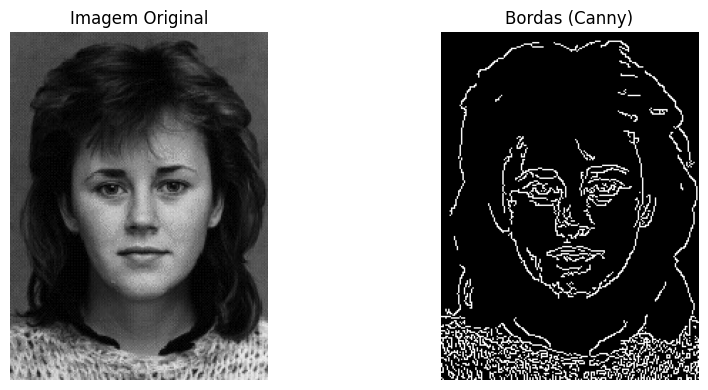

In [111]:
# Canny Edge Detection
def detect_edges_canny(image, threshold1, threshold2):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Aplicando o operador Canny
    edges = cv2.Canny(gray, threshold1, threshold2)

    return edges


# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path)

# Definindo os valores de limiarização
threshold1 = 100
threshold2 = 200

# Detectando as bordas usando o operador Canny
edges = detect_edges_canny(image, threshold1, threshold2)

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Exibindo a imagem original
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Imagem Original')
axes[0].axis('off')

# Exibindo as bordas detectadas usando o operador Canny
axes[1].imshow(edges, cmap='gray')
axes[1].set_title('Bordas (Canny)')
axes[1].axis('off')

plt.tight_layout()
plt.show()


CANNY COM FILTRO

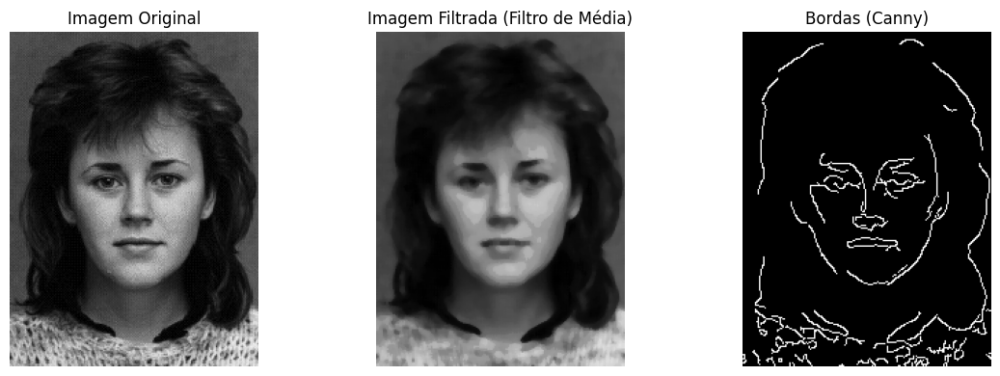

In [112]:
# Canny Edge Detection with Median Blur
def detect_edges_canny(image, threshold1, threshold2):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Aplicando o filtro de média na imagem original
    blurred_image = cv2.medianBlur(gray, 5)

    # Aplicando o operador Canny
    edges = cv2.Canny(blurred_image, threshold1, threshold2)

    return edges


# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path)

# Definindo os valores de limiarização
threshold1 = 100
threshold2 = 200

# Detectando as bordas usando o operador Canny com filtro de média
edges = detect_edges_canny(image, threshold1, threshold2)

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Exibindo a imagem original
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Imagem Original')
axes[0].axis('off')

# Aplicando o filtro de média na imagem original
filtered_image = cv2.medianBlur(image, 5)
axes[1].imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
axes[1].set_title('Imagem Filtrada (Filtro de Média)')
axes[1].axis('off')

# Exibindo as bordas detectadas usando o operador Canny
axes[2].imshow(edges, cmap='gray')
axes[2].set_title('Bordas (Canny)')
axes[2].axis('off')

plt.tight_layout()
plt.show()


#2- outra técnica para identificar bordas

FILTRO DE FRANGI

Um filtro projetado para detectar bordas em vasos sanguíneos ou estruturas tubulares em imagens médicas. É sensível a variações de intensidade e orientação.

 FRANGI SEM FILTRO DE MÉDIA

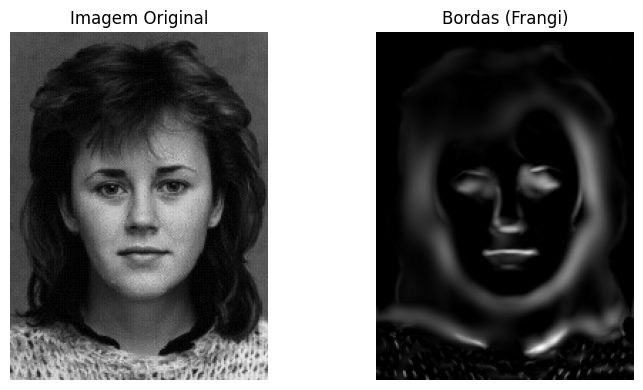

In [121]:
# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path)

# Convertendo a imagem para escala de cinza
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Aplicando o filtro de Frangi
frangi = filters.frangi(gray)

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Exibindo a imagem original
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Imagem Original')
axes[0].axis('off')

# Exibindo as bordas detectadas usando o filtro de Frangi
axes[1].imshow(frangi, cmap='gray')
axes[1].set_title('Bordas (Frangi)')
axes[1].axis('off')

plt.tight_layout()
plt.show()


FRANGI COM FILTRO DE MÉDIA

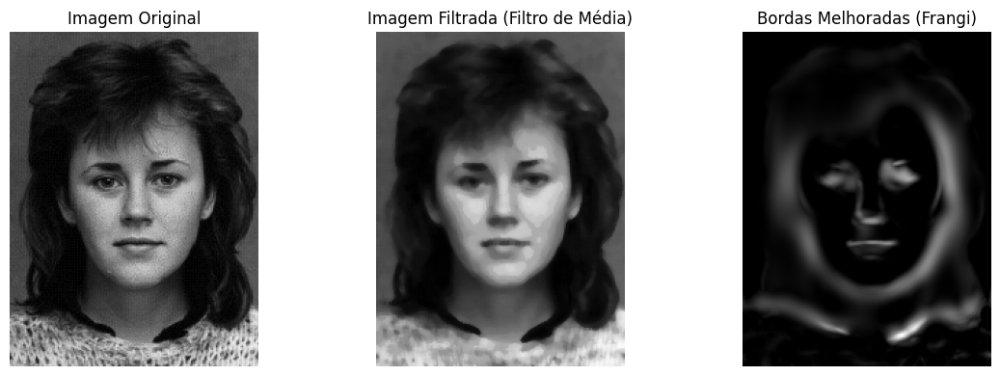

In [123]:


# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path)

# Convertendo a imagem para escala de cinza
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Aplicando o filtro de média na imagem original
filtered_image = cv2.medianBlur(gray, 5)

# Aplicando o algoritmo Frangi para melhorar as bordas
frangi_image = filters.frangi(filtered_image)

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Exibindo a imagem original
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Imagem Original')
axes[0].axis('off')

# Exibindo a imagem filtrada
axes[1].imshow(filtered_image, cmap='gray')
axes[1].set_title('Imagem Filtrada (Filtro de Média)')
axes[1].axis('off')

# Exibindo as bordas melhoradas usando o algoritmo Frangi
axes[2].imshow(frangi_image, cmap='gray')
axes[2].set_title('Bordas Melhoradas (Frangi)')
axes[2].axis('off')

plt.tight_layout()
plt.show()


# K-MENS

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


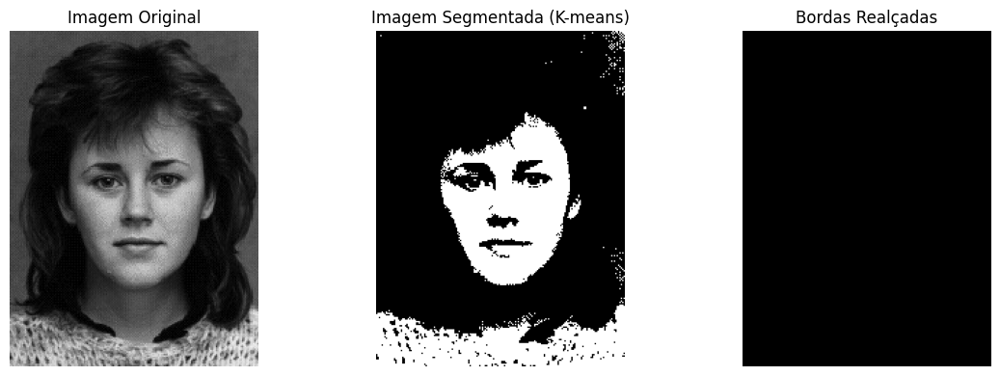

In [124]:
# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/rosto.jpg'
image = cv2.imread(image_path)

# Convertendo a imagem para o formato esperado pelo K-means
pixels = image.reshape(-1, 3).astype(np.float32)

# Aplicando o algoritmo K-means para segmentação
num_clusters = 2  # Número de clusters para segmentação
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(pixels)

# Obtendo os rótulos de cluster atribuídos a cada pixel
labels = kmeans.labels_

# Redefinindo a imagem com base nos rótulos de cluster
segmented_image = labels.reshape(image.shape[:2])

# Realçando as bordas
edges = cv2.Canny(segmented_image.astype(np.uint8), 30, 100)

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Exibindo a imagem original
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Imagem Original')
axes[0].axis('off')

# Exibindo a imagem segmentada
axes[1].imshow(segmented_image, cmap='gray')
axes[1].set_title('Imagem Segmentada (K-means)')
axes[1].axis('off')

# Exibindo as bordas realçadas
axes[2].imshow(edges, cmap='gray')
axes[2].set_title('Bordas Realçadas')
axes[2].axis('off')

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


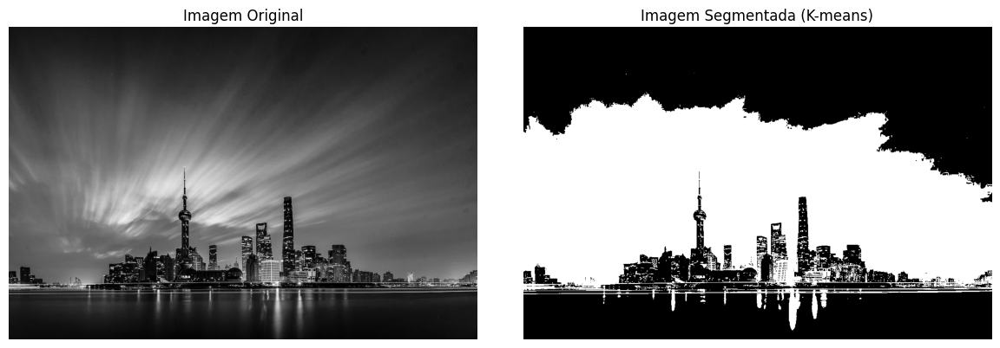

In [134]:
# Carregando a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/predio.jpg'
image = cv2.imread(image_path)

# Convertendo a imagem para o formato esperado pelo K-means
pixels = image.reshape(-1, 3).astype(np.float32)

# Aplicando o algoritmo K-means para segmentação
num_clusters = 2  # Número de clusters para segmentação
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(pixels)

# Obtendo os rótulos de cluster atribuídos a cada pixel
labels = kmeans.labels_

# Redefinindo a imagem com base nos rótulos de cluster
segmented_image = labels.reshape(image.shape[:2])

# Realçando as bordas
edges = cv2.Canny(segmented_image.astype(np.uint8), 30, 100)

# Criando uma figura com subplots para exibir as imagens
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Exibindo a imagem original
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Imagem Original')
axes[0].axis('off')

# Exibindo a imagem segmentada
axes[1].imshow(segmented_image, cmap='gray')
axes[1].set_title('Imagem Segmentada (K-means)')
axes[1].axis('off')


plt.tight_layout()
plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


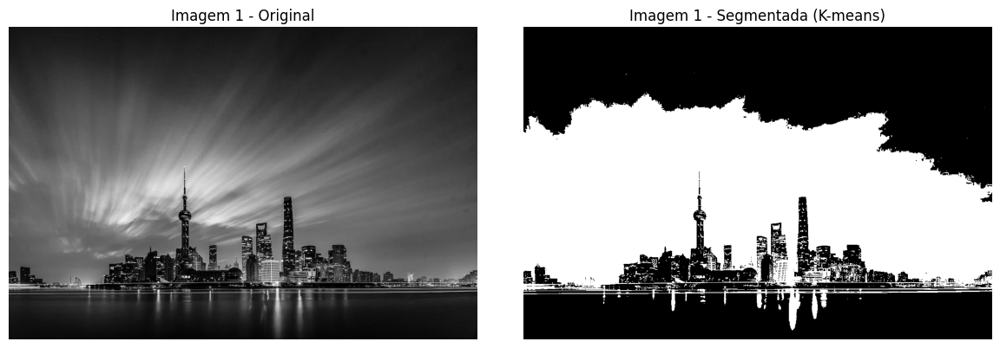

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


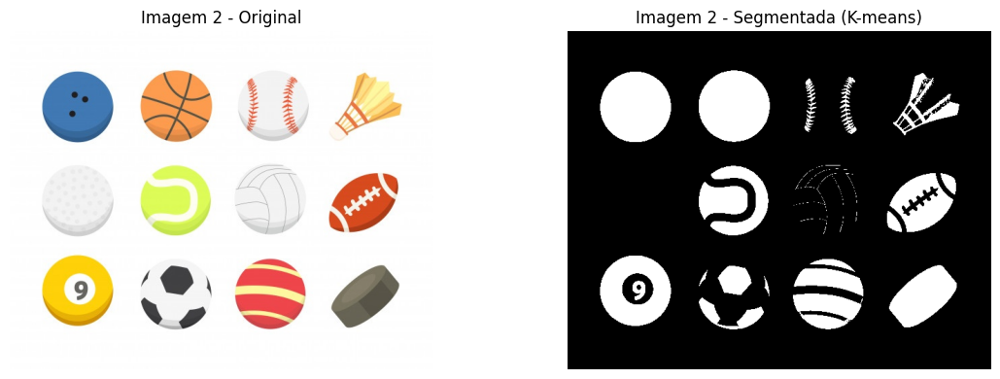

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


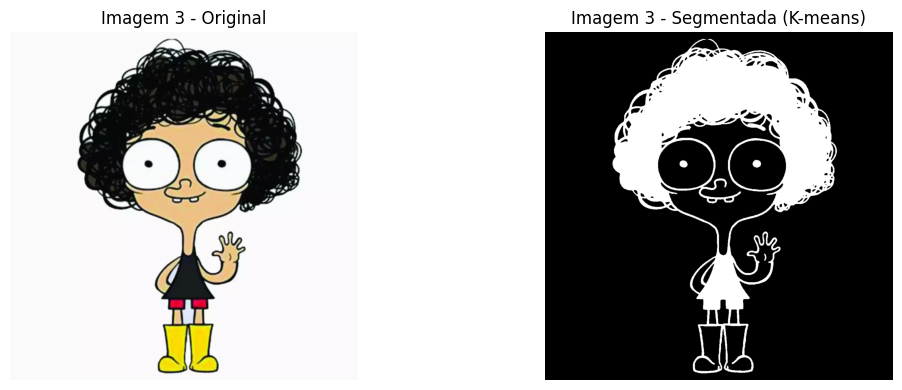

In [141]:


# Montar o Drive
drive.mount('/content/drive')

# Lista de caminhos das imagens
image_paths = [
    '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/predio.jpg',
    '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/bolas_.jpeg',
    '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/jorel.jpg'
]

# Loop sobre os caminhos das imagens
for i, image_path in enumerate(image_paths):
    # Carregando a imagem
    image = cv2.imread(image_path)

    # Convertendo a imagem para o formato esperado pelo K-means
    pixels = image.reshape(-1, 3).astype(np.float32)

    # Aplicando o algoritmo K-means para segmentação
    num_clusters = 2  # Número de clusters para segmentação
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(pixels)

    # Obtendo os rótulos de cluster atribuídos a cada pixel
    labels = kmeans.labels_

    # Redefinindo a imagem com base nos rótulos de cluster
    segmented_image = labels.reshape(image.shape[:2])

    # Realçando as bordas
    edges = cv2.Canny(segmented_image.astype(np.uint8), 30, 100)

    # Criando uma figura com subplots para exibir as imagens
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Exibindo a imagem original
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f'Imagem {i+1} - Original')
    axes[0].axis('off')

    # Exibindo a imagem segmentada
    axes[1].imshow(segmented_image, cmap='gray')
    axes[1].set_title(f'Imagem {i+1} - Segmentada (K-means)')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()


#  4- Identificar pontos na imagem

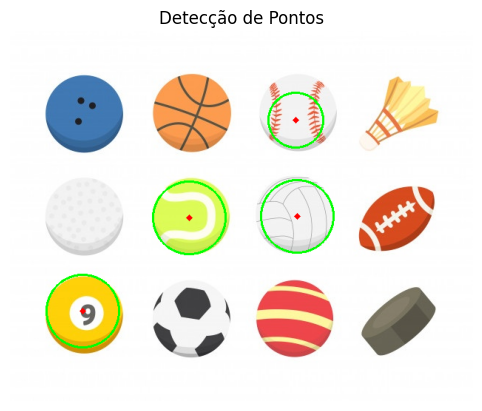

In [143]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Carregar a imagem
image_path = '/content/drive/MyDrive/DISCIPLINAS/IMAGENS_MÉDICAS/bolas_.jpeg'
image = cv2.imread(image_path)

# Converter a imagem para escala de cinza
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Aplicar a detecção de bordas usando o operador Canny
edges = cv2.Canny(gray, 50, 150)

# Aplicar a transformada de Hough para detectar círculos
circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1, minDist=100, param1=50, param2=30, minRadius=10, maxRadius=50)

if circles is not None:
    circles = np.round(circles[0, :]).astype(int)
    
    # Desenhar os círculos na imagem original
    for (x, y, r) in circles:
        cv2.circle(image, (x, y), r, (0, 255, 0), 2)
        cv2.circle(image, (x, y), 2, (0, 0, 255), 3)

    # Exibir a imagem com os círculos detectados
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Detecção de Pontos')
    plt.axis('off')
    plt.show()
else:
    print('Nenhum ponto detectado na imagem.')
